# Russian Meddling in 2016 Presidential Election
## By: Kevin Loftis & Ariana Moncada

In [1]:
%load_ext rpy2.ipython
import pandas as pd
import numpy as np
import os
import rpy2.robjects as robj
from rpy2.robjects import pandas2ri
import matplotlib.pyplot as plt
import json

In [2]:
%R library(ggplot2)
%R library(scales)
%R library(png)

array(['png', 'scales', 'ggplot2', 'tools', 'stats', 'graphics',
       'grDevices', 'utils', 'datasets', 'methods', 'base'], dtype='<U9')

## Convert Raw JSON data to csv

*Raw data can be found at: https://github.com/russian-ad-explorer/russian-ad-datasets/tree/master/json*

In [3]:
with open('russian_ads.json') as f:
    data = json.load(f)

In [4]:
data = pd.DataFrame(data)
data.to_csv('russian_data.csv')

## Read in the Russian Ad Data

In [5]:
ads = pd.read_csv('russian_data.csv',index_col=0)

In [6]:
# Convert to Datetime
ads.ad_creation_date = pd.to_datetime(ads.ad_creation_date)

# Truncate Date to Month
ads['ad_creation_date_month'] = ads.ad_creation_date.astype('<M8[M]')

## Graph 1 - Ads Overtime

In [7]:
ads_overtime_month = ads.groupby(['ad_creation_date_month'])['ad_id'].agg(['count']).reset_index()
ads_overtime_month.ad_creation_date_month = pd.to_datetime(ads_overtime_month.ad_creation_date_month)
ads_overtime_month.head()

,ad_creation_date_month,count
0,2015-06-01,114
1,2015-07-01,133
2,2015-08-01,74
3,2015-09-01,87
4,2015-10-01,60


In [8]:
%R -i ads_overtime_month

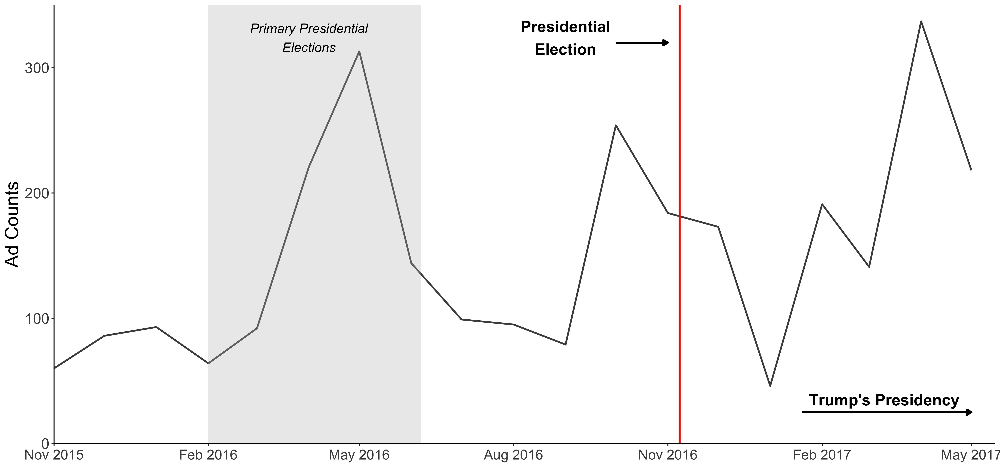

In [9]:
%%R -w 15 -h 7 --units in -r 400
ggplot() +
    # Line graph of ads overtime
    geom_line(aes(x=as.Date(ad_creation_date_month), y=count, group=1), data=ads_overtime_month, 
              color='grey30',size=.9) +
    # Vertical Red Line on Presidential Election Date
    geom_vline(aes(xintercept = as.Date("2016-11-08")), col = "red", size=1) +
    # Annotation for Presidential Election
    geom_text(aes(label = "Presidential\nElection"), x = as.Date("2016-09-01"), y = 324,
              color = "black",fontface="bold", size=6) +
    # Arrow for Presidential Election Annotation
    geom_segment(aes(x = as.Date("2016-10-01"), y = 320, xend = as.Date("2016-11-01"),yend = 320),
                 arrow = arrow(type = "closed",length = unit(0.2, "cm")), color = 'black', size=1) +
    # Grey box for Primary Elections range
    annotate("rect", xmin = as.Date("2016-02-01"), xmax = as.Date("2016-06-07"), ymin = 0, 
             ymax = 350, alpha = 0.3, fill='grey') + 
    # Annotate for Primary Elections
    geom_text(aes(label = "Primary Presidential\nElections"),x = as.Date("2016-04-01"),
              y = 324, color = "black",fontface="italic", size=5) +
    # Arrow for Trump Presidency Annotation
    geom_segment(aes(x = as.Date("2017-01-20"), y = 25, xend = as.Date("2017-05-01"),yend = 25),
                 arrow = arrow(type = "closed",length = unit(0.2, "cm")), color = 'black', size=1) +
    # Annotate for Trump Presidency
    geom_text(aes(label = "Trump's Presidency"),x = as.Date("2017-03-10"),
              y = 35, color = "black",fontface="bold", size=6) +
    # Set x-axis scale to every 3 months
    scale_x_date(name='',breaks='3 month',date_labels='%b %Y',limits = as.Date(c('2015-11-01','2017-05-15'))) +
    # Push graphs towards y-aixs
    coord_cartesian(expand = FALSE, clip = "off") +
    ylab('Ad Counts') +
    theme_classic() +
    # Keep only horizontal y major axis
    theme(text = element_text(size=20),
            axis.text.x = element_text(size = 15,hjust=0.5, vjust = 0.5),
            axis.title.x=element_blank())

# Save Graph
# ggsave('./ads_overtime.png', units = 'in', width = 15, height = 7)

## Graph 2 - Progressive & Conservative Ads overtime

***Classify Ad interest groups as either Conservative or Progressive***

In [10]:
# remove ads temporarily that are not labeled as being part of an interest group
ads_graph2 = ads.loc[~ads.interests_categories_regex.isna(),:]

# Split ad interest categories value by seperator '_'
# Create a unique interest category list
my_list = []
for nested_list in list(ads_graph2.interests_categories_regex.str.split('_')):
    for element in nested_list:
        my_list.append(element)
unique_interests = list(set(my_list))

# Split unique interest groups into two groups

# Conservative interests groups
conservative = [
'Conservative',
'Army',
'Texas',
'American South',
'Patriotism',
'Anti-Immigrant',
'Christianity',
'Police',
'Gun Rights']

# Progressive interests groups
progressive = [
 'Latinx',
 'Islam',
 'African American',
 'Progressive',
 'Native American',
 'LGBTQ',
 'Prison']

# Interests groups that we do not want to use for our analysis
remove = ['Above Age 30',
 'Below Age 30',
 'Geographic',
 'Memes',
 'Memes and Products',
 'Products',
 'Self-Defense',
 'Unknown']

***Create column identifiers for unique interest groups***

In [41]:
# Default category column value = 0
for group in unique_interests:
    ads_graph2[group] = 0

# Assign value = 1 if belonging to category
for group in unique_interests:
    ads_graph2.loc[(ads_graph2['interests_categories_regex'].str.contains(group)),group] = 1

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [12]:
# Create Conservative Dataframe
adsC = ads_graph2.copy()
adsC['Party'] = 'Other'

# Create Progressive Dataframe
adsP = ads_graph2.copy()
adsP['Party'] = 'Other'

# Assign interest groups to their respective dataframes
for group in unique_interests:
    if group in progressive:
        adsP.loc[adsP[group] == 1,'Party'] = 'Progressive'
    elif group in conservative:
        adsC.loc[adsC[group] == 1,'Party'] = 'Conservative'

# Keep progressive and conservative ads only, remove 'Other' categories
adsP = adsP.loc[adsP.Party == 'Progressive']
adsC = adsC.loc[adsC.Party == 'Conservative']

***Aggregate Ad Counts for each month***

In [13]:
# Progressive Ads Count Overtime
adsP_overtime_month = adsP.groupby(['ad_creation_date_month'])['ad_id'].agg(['count']).reset_index()
adsP_overtime_month.ad_creation_date_month = pd.to_datetime(adsP_overtime_month.ad_creation_date_month)

# Conservative Ads Count Overtime
adsC_overtime_month = adsC.groupby(['ad_creation_date_month'])['ad_id'].agg(['count']).reset_index()
adsC_overtime_month.ad_creation_date_month = pd.to_datetime(adsC_overtime_month.ad_creation_date_month)

In [14]:
%R -i adsC_overtime_month
%R -i adsP_overtime_month

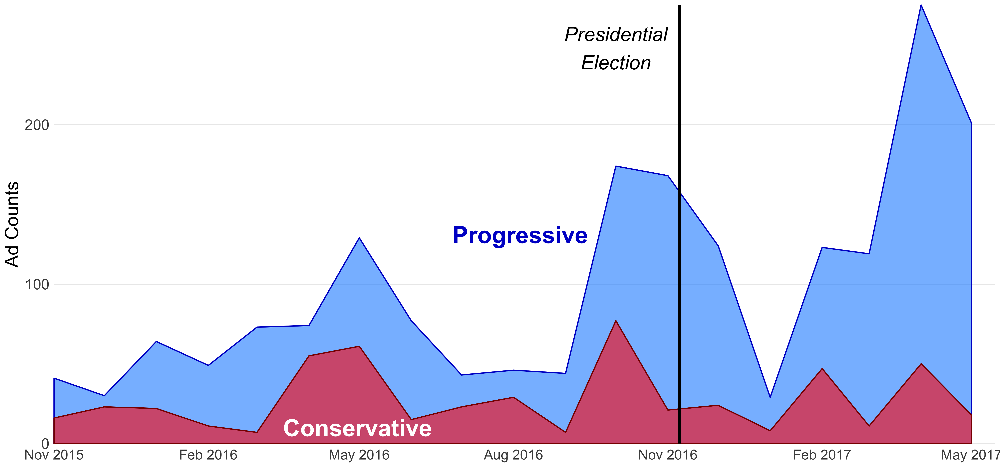

In [15]:
%%R -w 15 -h 7 --units in -r 400
ggplot() + 
    # Area graph for Progressive Ads overtime
    geom_area(aes(x=as.Date(ad_creation_date_month), y=count, fill='blue'),
              data=adsP_overtime_month, color='blue3',size=.65,show.legend = FALSE) +
    # Area graph for Conservative Ads overtime
    geom_area(aes(x=as.Date(ad_creation_date_month), y=count, fill='red'),
              data=adsC_overtime_month, color='red4',size=.65,show.legend = FALSE) +
    # Manually assign fill colors
    scale_fill_manual(values = alpha(c('dodgerblue', 'red'), .6)) +
    # Vertical line for Presidential Election date
    geom_vline(aes(xintercept = as.Date("2016-11-08")), col = "black", size=1.5) +
    # Annotate Presidential Election
    geom_text(aes(label = "Presidential\nElection"),x = as.Date("2016-10-01"), y = 248,
              color = "black",fontface="italic", size=7.5) +
    # Annotate Progessive
    geom_text(aes(label = "Progressive"),x = as.Date("2016-08-05"),y = 131, color = "blue3",
              fontface="bold", size=9) +
    # Annotate Conservative
    geom_text(aes(label = "Conservative"),x = as.Date("2016-04-30"), y = 10,
              color = "white",fontface="bold", size=9) +
    # x-axis scale to every 3 months
    scale_x_date(name='',breaks='3 month',date_labels='%b %Y',limits = as.Date(c('2015-11-01','2017-05-15')))+
    # Push graphs towards y-axis
    coord_cartesian(expand = FALSE, clip = "off") +
    ylab('Ad Counts') +
    theme_minimal() + 
    # Keep only vertical y major axis
    theme(text = element_text(size=20),
          axis.text.x = element_text(size = 15,hjust=0.5, vjust = 0.5),
          axis.title.x=element_blank(),
          panel.grid.minor=element_blank(),panel.grid.major.x=element_blank())

# Save Graph
# ggsave('./ads_prog_cons.png', units = 'in', width = 15, height = 7)

## Graph 3 - Interest Groups

In [16]:
# Create dataframe for counts of interest groups
ad_counts = (ads_graph2[unique_interests].agg('sum').sort_values(ascending=True)
             .to_frame()
             .reset_index()
             .rename(columns={'index':'interest_group',0:'count'}))

# Convert interest group column to category type
ad_counts['interest_group'] = ad_counts.interest_group.astype("category",ordered=True,\
                                                              categories=ad_counts.interest_group)

/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3296: FutureWarning: specifying 'categories' or 'ordered' in .astype() is deprecated; pass a CategoricalDtype instead
  exec(code_obj, self.user_global_ns, self.user_ns)


In [17]:
# Remove the 'Unknown' ad category group
ad_counts = ad_counts.loc[ad_counts.interest_group != 'Unknown']

# Flag group with highest number of ads 
ad_counts['flag'] = "Non African American"
ad_counts.loc[ad_counts.interest_group == 'African American','flag'] = 'African America'
ad_counts.sort_values('count',ascending=False,inplace=True)

# Extract top ten ad interest groups with highest ad counts
ad_counts = ad_counts.iloc[0:10,:]

In [18]:
%R -i ad_counts

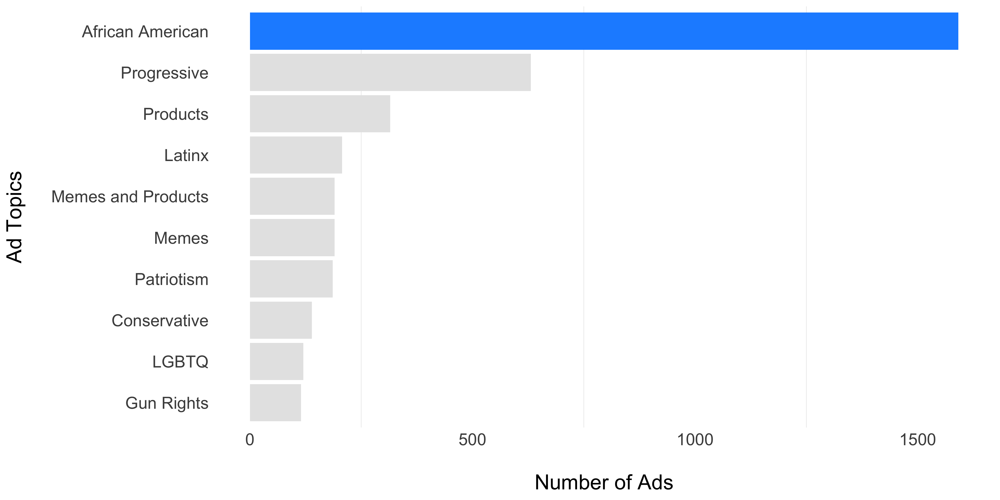

In [19]:
%%R -w 12 -h 6 --units in -r 400
    ggplot()+
    # Bar graph for top 10 interest groups
    geom_bar(aes(x=interest_group, y=count,fill=flag),data=ad_counts, 
             stat='identity',show.legend=FALSE)+
    # Manually set fill colors
    scale_fill_manual(values = c('dodgerblue','grey90'))+
    # Set y & x- axis labels
    xlab('Ad Topics\n') +
    ylab('\nNumber of Ads') +
    theme_minimal() +
    # Keep only vertical axis
    theme(text = element_text(size=18), panel.grid.major.x = element_blank(),
          panel.grid.major.y = element_blank()) +
    coord_flip()

# Save Graph
# ggsave('./groups.png', units = 'in', width = 12, height = 6)

## Graph 4 - Sentiment

In [20]:
import numpy as np
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [21]:
# For Sentiment Analysis we need to fill NA ad text with empty strings ''
ads.ad_copy.fillna('',inplace=True)

In [22]:
# Create Ad Sentiment column, compound polarity score of ad text
ads.loc[:,'ad_sentiment'] = ads.ad_copy.apply(lambda x: analyser.polarity_scores(x)['compound'])

In [23]:
# There is one ad with conversion rate = 1, skewing plot so we removed it
ads_temp = ads.loc[ads.conversion_rate < 1]

In [24]:
# Fix Pandas df for R - Credit: Paul Intrevado
def fixDFcolsForR(myDF):
    for i in range(myDF.shape[1]): # for each col
        if myDF.iloc[:, i].dtype == 'O': # check if col is type object
            myDF.iloc[:, i] = myDF.iloc[:, i].astype(str) # if yes set type to string
    return myDF

In [25]:
ads_temp = fixDFcolsForR(ads_temp)
ads_temp.loc[:,'ad_creation_date_month'] = ads_temp.ad_creation_date_month.astype(str)

/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [26]:
# Get ad counts of positive, negative & neutral sentiment
print('Sentiment value < 0:', ads_temp.loc[ads_temp.ad_sentiment < 0]['ad_id'].nunique())
print('Sentiment value > 0:', ads_temp.loc[ads_temp.ad_sentiment > 0]['ad_id'].nunique())
print('Sentiment value = 0:', ads_temp.loc[ads_temp.ad_sentiment == 0]['ad_id'].nunique())

Sentiment value < 0: 801
Sentiment value > 0: 1218
Sentiment value = 0: 475


In [27]:
# Create flag column for positive, negative & neutral ads
ads_temp['flag_sentiment'] = 'Neutral'
ads_temp.loc[ads_temp.ad_sentiment > 0.1,'flag_sentiment'] = 'Positive'
ads_temp.loc[ads_temp.ad_sentiment < 0.1,'flag_sentiment'] = 'Negative'

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [28]:
# Import R libraries to create color palette
%R library(grDevices)
%R library(RColorBrewer)

array(['RColorBrewer', 'png', 'scales', 'ggplot2', 'tools', 'stats',
       'graphics', 'grDevices', 'utils', 'datasets', 'methods', 'base'],
      dtype='<U12')

In [29]:
%%R 
pal <- colorRampPalette(c("blue", "green"))
mycolors <- colorRampPalette(brewer.pal(8, "BrBG"))(18)
fair_cols <- list(pal(20))
fair_cols[1]

[[1]]
 [1] "#0000FF" "#000DF1" "#001AE4" "#0028D6" "#0035C9" "#0043BB" "#0050AE"
 [8] "#005DA1" "#006B93" "#007886" "#008678" "#00936B" "#00A15D" "#00AE50"
[15] "#00BB43" "#00C935" "#00D628" "#00E41A" "#00F10D" "#00FF00"



**Note:** We tried using the fair_cols object in below code, but for some reason R was not accepting colours=fair_cols in scale_colour_gradientn(colours=) parameter.

In [30]:
# Grab columns we need
ads_temp = ads_temp[['conversion_rate','ad_sentiment']]

In [31]:
%R -i ads_temp

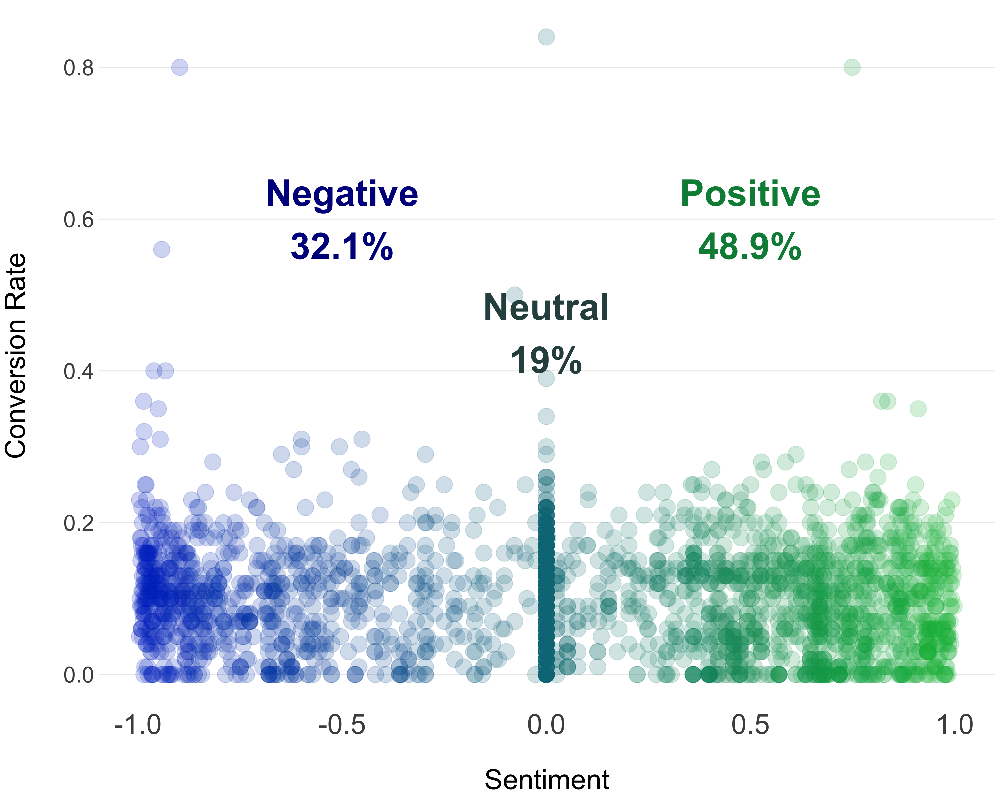

In [32]:
%%R -w 15 -h 12 --units in -r 400
ggplot() +
    # Ad points, colored by sentiment group (positive, negative, neutral)
    geom_point(aes(x=ad_sentiment,y=conversion_rate,color=ad_sentiment),
               data=ads_temp, size=8,alpha=.2,show.legend=FALSE) +
    scale_colour_gradientn(colours=c("#0035C9","#0043BB","#0050AE","#005DA1",
                                     "#006B93","#007886","#008678","#00936B",
                                     "#00A15D","#00AE50","#00BB43")) +
    # Annotate Negative Ad Percentage
    geom_text(aes(label = "Negative\n32.1%"),x = -.5,y = .6, color = "darkblue",
                fontface="bold", size=14) +
    # Annotate Positive Ad Percentage
    geom_text(aes(label = "Positive\n48.9%"),x = .5,y = .6, color = "springgreen4",
                fontface="bold", size=14) +
    # Annotate Neutral Ad Percentage
    geom_text(aes(label = "Neutral\n19%"),x = 0,y = .45, color = "darkslategrey",
                fontface="bold", size=14) +
    xlab('\nSentiment') +
    ylab('Conversion Rate\n') +
    theme_minimal() +
    theme(text = element_text(size=30),
          axis.text.x = element_text(size = 30, angle = 0, hjust=0.5, vjust = 0.5),
          panel.grid.minor=element_blank(),panel.grid.major.x=element_blank())

# Save Graph
# ggsave('./ads_sentiment.png', units = 'in', width = 15, height = 12)

## Graph 5 - Sentiment Overtime

In [33]:
# Create dataframe for mean ad sentiment overtime
sentiment_overtime = ads.groupby('ad_creation_date_month').agg({'ad_sentiment':'mean'}).reset_index()

In [34]:
sentiment_overtime.head()

,ad_creation_date_month,ad_sentiment
0,2015-06-01,0.063144
1,2015-07-01,0.043372
2,2015-08-01,-0.164658
3,2015-09-01,0.025921
4,2015-10-01,-0.024621


In [35]:
# Create dataframe for before & after election
before = sentiment_overtime.loc[(sentiment_overtime.ad_creation_date_month <= '2016-10-01')]['ad_sentiment'].mean()
after = sentiment_overtime.loc[(sentiment_overtime.ad_creation_date_month > '2016-10-01')]['ad_sentiment'].mean()

In [36]:
%R -i sentiment_overtime
%R -i before
%R -i after

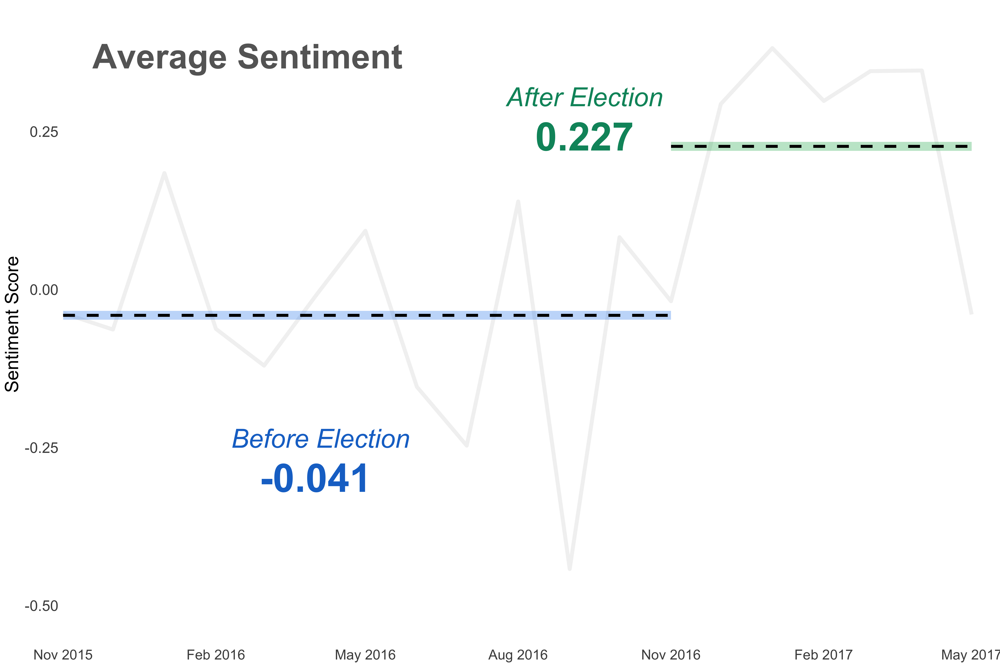

In [37]:
%%R -w 15 -h 10 --units in -r 400
ggplot() +
    # Line graph of average sentiment overtime
    geom_line(aes(x=as.Date(ad_creation_date_month),y=ad_sentiment), data=sentiment_overtime,
              size=2,color='grey87',alpha=.4) +
    # Horizontal Colored Segment - Before Election
    annotate("rect", xmin = as.Date("2015-11-01"), xmax = as.Date("2016-11-01"), ymin = before-.007, 
             ymax = before+.007, alpha = 0.3, fill="dodgerblue2") + 
    # Horizontal Colored Segment - After Election
    annotate("rect", xmin = as.Date("2016-11-01"), xmax = as.Date("2017-05-01"), ymin = after-.007, 
             ymax = after+.007, alpha = 0.3, fill='#00AE50') + 
    # Horizontal Dashed line - Before Election
    geom_segment(aes(x = as.Date("2015-11-01"), y = before, xend = as.Date("2016-11-01"), 
                     yend = before),linetype='dashed', size=1.5) +
    # Horizontal Dashed line - After Election
    geom_segment(aes(x = as.Date("2016-11-01"), y = after, xend = as.Date("2017-05-01"), 
                     yend = after),linetype='dashed', size=1.5) +
    # x-axis scale to every 3 months
    scale_x_date(name='',breaks='3 month',date_labels='%b %Y',
                 limits = as.Date(c('2015-11-01','2017-05-15')))+
    # Annotate Average sentiment - Before Election
    geom_text(aes(label = "-0.041"),x = as.Date("2016-04-01"),y = -.32,
              color = "dodgerblue3", fontface="bold", size=15,vjust = 0) +
    # Annotate Before Election
    geom_text(aes(label = "Before Election"),x = as.Date("2016-04-04"),y = -.25,
              color = "dodgerblue3", fontface="italic", size=10,vjust = 0) +
    # Annotate Average sentiment - After Election
    geom_text(aes(label = "0.227"),x = as.Date("2016-09-10"),y = .22, color = "#00936B",
                fontface="bold", size=15,vjust = 0) +
    # Annotate After Election
    geom_text(aes(label = "After Election"),x = as.Date("2016-09-10"),y = .29, color = "#00936B",
                fontface="italic", size=10,vjust = 0) +
    # Annotate Title
    geom_text(aes(label = "Average Sentiment"),x = as.Date("2016-02-20"),y = .35, color = "grey40",
                fontface="bold", size=13,vjust = 0) +
    # Set y-axis limits
    scale_y_continuous(limits=c(-.56,.45))+
    # Push graphs towards y-aixs
    coord_cartesian(expand = FALSE, clip = "off") +
    ylab('Sentiment Score') +
    theme_minimal() + 
    # Remove all major & minor gridlines
    theme(text = element_text(size=20),
          axis.text.x = element_text(size = 15, hjust=0.5, vjust = 0.5),
          axis.title.x=element_blank(),
          panel.grid.minor=element_blank(),panel.grid.major.x=element_blank(),
          panel.grid.major.y=element_blank())

# Save Graph
# ggsave('./ads_sentiment_overtime.png', units = 'in', width = 15, height = 10)

## Graph 6 - Ad Spend

In [38]:
# Sum ad cost for all ads
cost_of_ads = ads.ad_spend_usd.sum()

# Cost of Hillary & Trump campaign combined
cost_hillary_trump_campaign = 81_000_000

# Credit: https://bit.ly/2OJeLbH

In [39]:
%R -i cost_of_ads
%R -i cost_hillary_trump_campaign

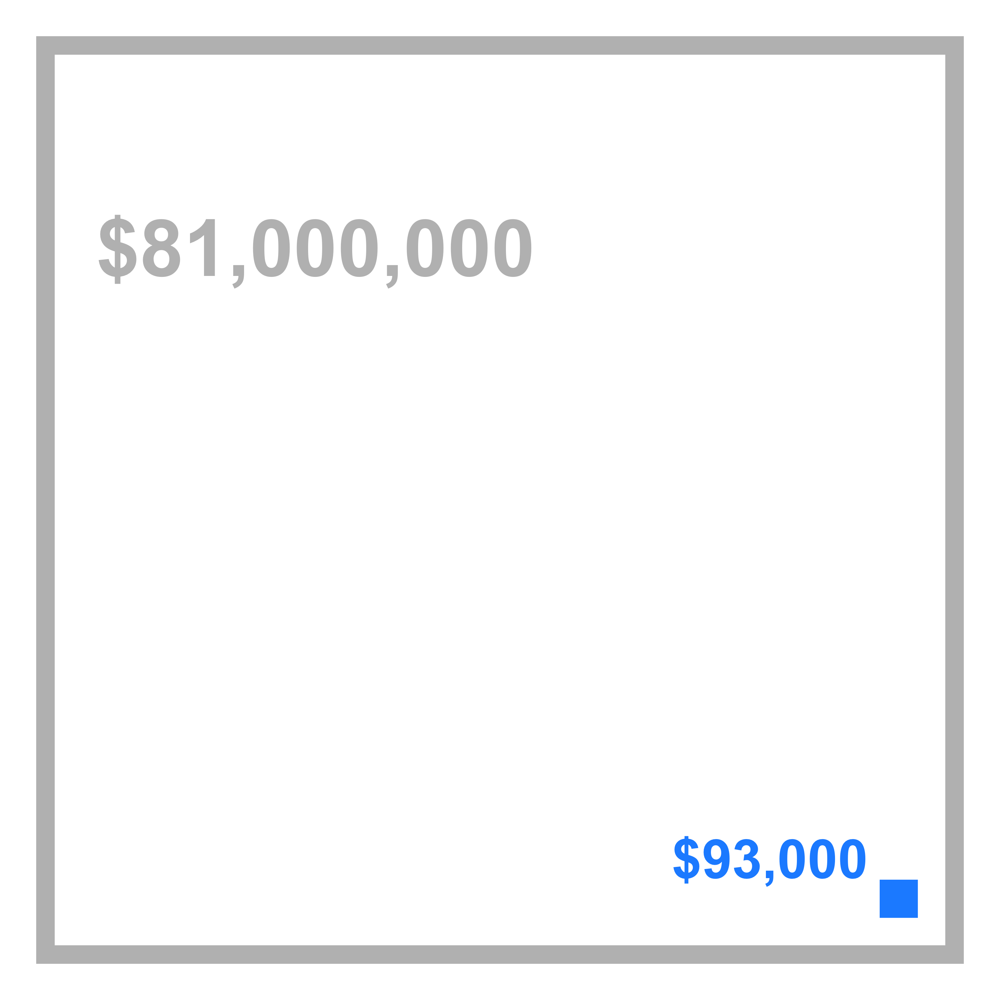

In [40]:
%%R -w 8 -h 8 --units in -r 400 
small_square_min_pos = 400
ggplot()+
    # Big grey box 
    annotate(geom='rect',xmin=0,ymin=0,
             xmax=sqrt(cost_hillary_trump_campaign),ymax=sqrt(cost_hillary_trump_campaign),
             color='gray',lwd = 5,fill=NA)+
    # Little blue box 
    annotate(geom='rect',
             xmin=sqrt(cost_hillary_trump_campaign)-small_square_min_pos,
             ymin=0 + small_square_min_pos,
             xmax=sqrt(cost_hillary_trump_campaign)-sqrt(cost_of_ads)-small_square_min_pos,
             ymax=sqrt(cost_of_ads) + small_square_min_pos,
             color='dodgerblue',fill='dodgerblue',lwd=2)+
    # Annotate Campaign cost
    annotate(geom='text',label='$81,000,000',x=500,y=7000,size=16,hjust=0,color='grey',fontface='bold')+
    # Annotate Ad cost
    annotate(geom='text',label='$93,000',x=6200,y=950,size=11,hjust=0,color='dodgerblue',fontface='bold')+
    theme_void()

# Save Graph
# ggsave('./ads_spend.png', units = 'in', width = 8, height = 8)